In [28]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_laplace
from skimage.restoration import denoise_bilateral

In [1]:
''' 
Running this cell will open a video capture window 
to take a picture with the space key
'''

cam = cv2.VideoCapture(0)
cv2.namedWindow('Camera')

while(True):
    ret, frame = cam.read()
    # Display the captured image
    cv2.imshow('Camera', frame) 
    # Save on pressing 'y' 
    key = cv2.waitKey(1)
    if key%256 == 32:
        img_name = f'capture_{time.time()}.png'
        cv2.imwrite(img_name, frame)
        cv2.destroyAllWindows()
        break

cam.release()

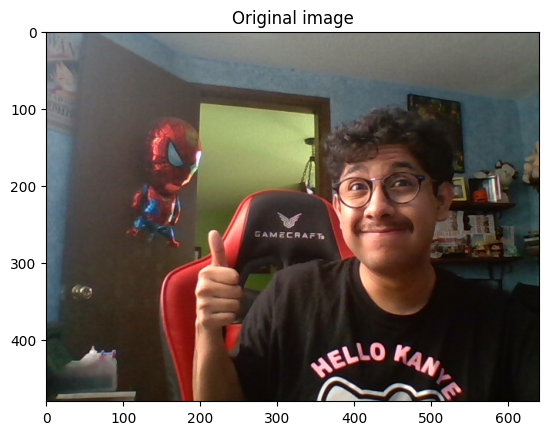

In [2]:
# Run this cell after capturing the picture, change path if needed

img = cv2.imread(img_name)
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

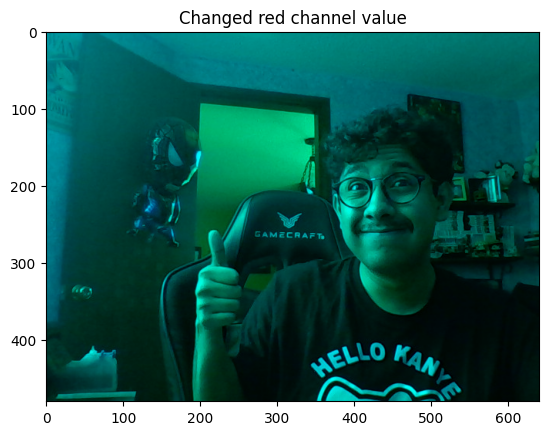

In [3]:
# Run this cell to change the red channel of the image taken

diff_red_img = np.copy(img)

# Create filter, change = 0 value as you want
diff_red_img[:, :, 0] = 0

plt.imshow(diff_red_img)
plt.title('Changed red channel value')
plt.show()

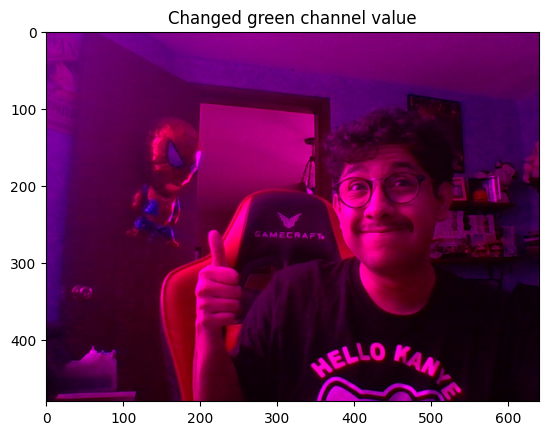

In [4]:
# Run this cell to change the green channel of the image taken
diff_green_img = np.copy(img)

# Create filter, change = 0 value as you want
diff_green_img[:, :, 1] = 0

plt.imshow(diff_green_img)
plt.title('Changed green channel value')
plt.show()

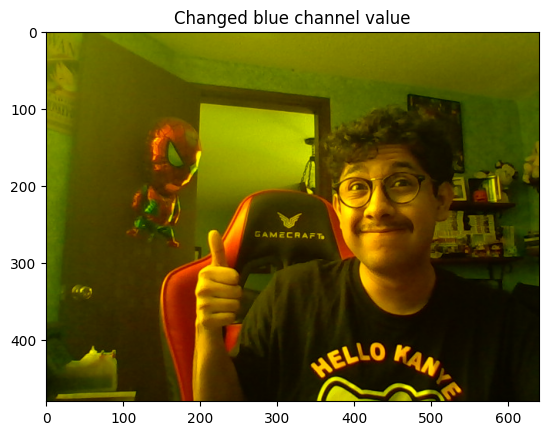

In [5]:
# Run this cell to change the blue channel of the image taken
diff_blue_img = np.copy(img)

# Create filter, change = 0 value as you want
diff_blue_img[:, :, 2] = 0

plt.imshow(diff_blue_img)
plt.title('Changed blue channel value')
plt.show()

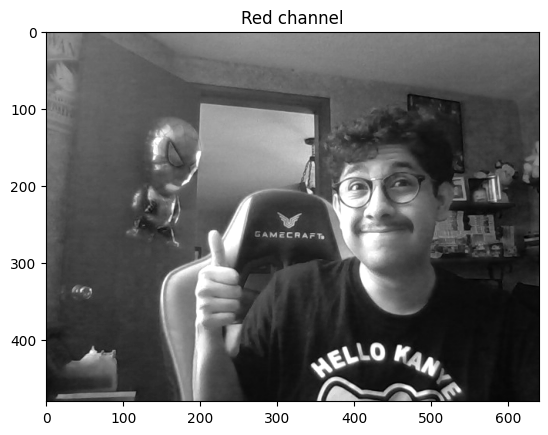

In [6]:
# Run this cell to change the RGB channels of the image taken
diff_rgb_img = np.copy(img)

# Create filter, change channel as needed
# 0 for R, 1 for G and 2 for B
channel = 0
display_channel = diff_rgb_img[:, :, channel]

channel_name = ''
match channel:
  case 0:
    channel_name = 'Red'
  case 1: 
    channel_name = 'Green'
  case 2: 
    channel_name = 'Blue'

plt.imshow(display_channel, cmap='gray')
plt.title(f'{channel_name} channel')
plt.show()

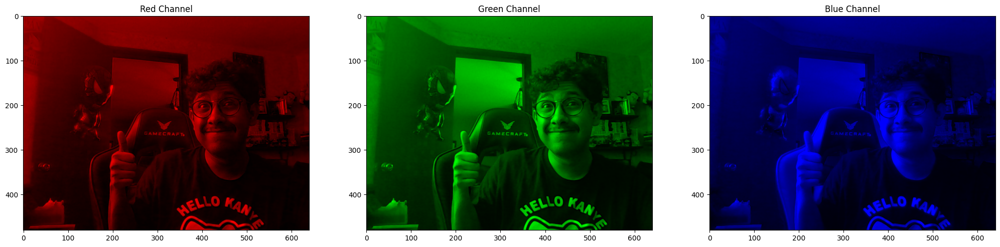

In [7]:
# Run this cell to show all the channes in their respective colors
zeros = np.zeros_like(img)

# Blue channel
blue_image = zeros.copy()
blue_image[:, :, 0] = img[:, :, 0]

# Green channel
green_image = zeros.copy()
green_image[:, :, 1] = img[:, :, 1]

# Red channel
red_image = zeros.copy()
red_image[:, :, 2] = img[:, :, 2]

# Display the channels
plt.figure(figsize=(25, 15))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(red_image, cv2.COLOR_BGR2RGB))
plt.title('Red Channel')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(green_image, cv2.COLOR_BGR2RGB))
plt.title('Green Channel')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(blue_image, cv2.COLOR_BGR2RGB))
plt.title('Blue Channel')

# Show all channels
plt.show()

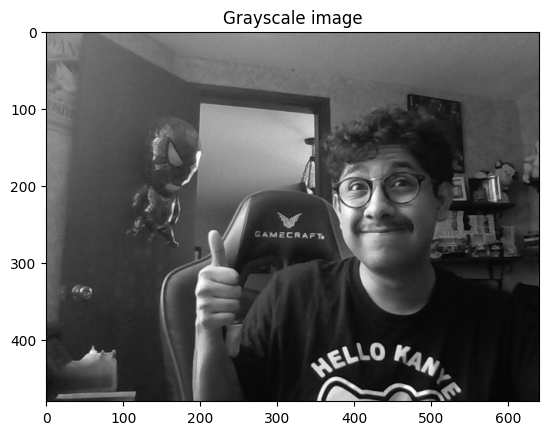

In [8]:
# Run this cell to convert to grayscale the image taken
grayscale_img = np.copy(img)

grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plt.imshow(grayscale_img, cmap='gray')
plt.title('Grayscale image')
plt.show()

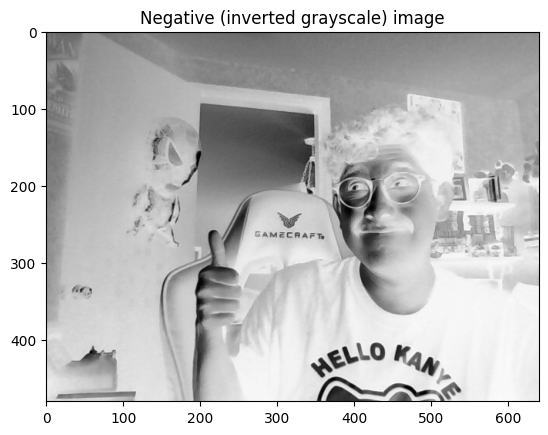

In [9]:
# Run ths cell to invert the grayscale of the image taken
inv_grayscale_img = np.copy(grayscale_img)

inv_grayscale_img = 255 - grayscale_img

plt.imshow(inv_grayscale_img, cmap='gray')
plt.title('Negative (inverted grayscale) image')
plt.show()

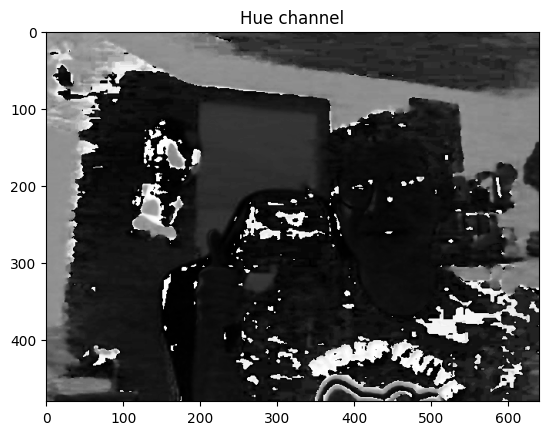

In [10]:
# Run this cell to change RGB to HSV of the image taken
hsv_img = np.copy(img)

hsv_img = cv2.cvtColor(hsv_img, cv2.COLOR_RGB2HSV)

# Create filter, change channel as needed
# 0 for H, 1 for S and 2 for V
channel = 0
display_channel = hsv_img[:, :, channel]

channel_name = ''
match channel:
  case 0:
    channel_name = 'Hue'
  case 1: 
    channel_name = 'Saturation'
  case 2: 
    channel_name = 'Value'

plt.imshow(display_channel, cmap='gray')
plt.title(f'{channel_name} channel')
plt.show()

In [26]:
cam = cv2.VideoCapture(0)
cv2.namedWindow('Camera')

while(True):
    ret, frame = cam.read()
    # Display the captured image
    cv2.imshow('Camera', frame) 
    # Save on pressing 'y' 
    key = cv2.waitKey(1)
    if key%256 == 32:
        img_name = f'capture_{time.time()}.png'
        cv2.imwrite(img_name, frame)
        cv2.destroyAllWindows()
        break

cam.release()

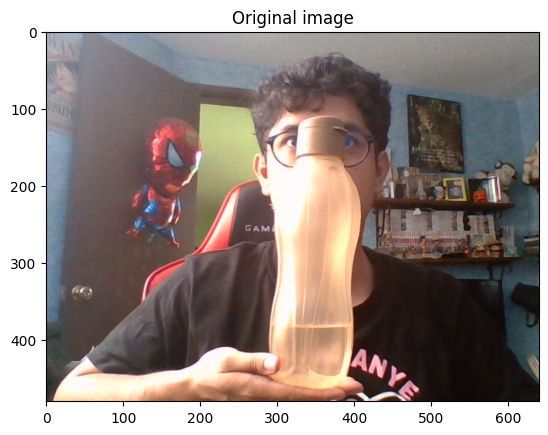

In [12]:
img = cv2.imread(img_name)
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

In [13]:
'''
Estimate f number using: 
f = (h'*d)/h
h' is the height of the object in pixels
d is the distance of the object to the camera in meters
h is the height of the object in meters
'''

d = 0.4 # 40 cm = 0.4 m
h = 0.37 # 37 cm = 0.37 m
h_prime = 450 # 450 px, from approx 100 to 550 in the scale

f = (h_prime*d)/h
f

486.4864864864865

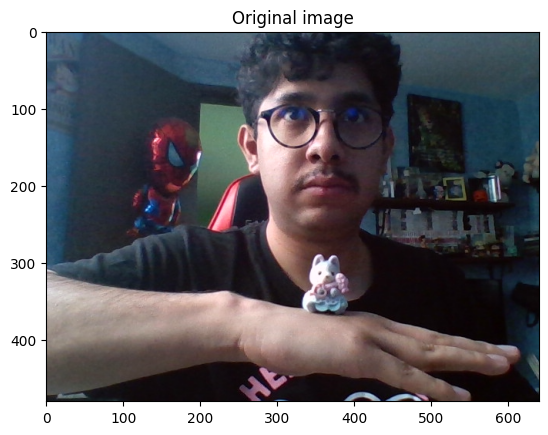

In [15]:
img = cv2.imread(img_name)
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

In [19]:
'''
Estimate distance using: 
d = (h*f)/h'
h' is the height of the object in pixels
f is the focal length of the object to the camera in milimeters
h is the height of the object in meters
'''

h = 0.035 # 3.5 cm = 0.035 m
h_prime = 70 # 70 px, from approx 290 to 460 in the scale

d_1 = (h*f)/h_prime
d_1

0.24324324324324326

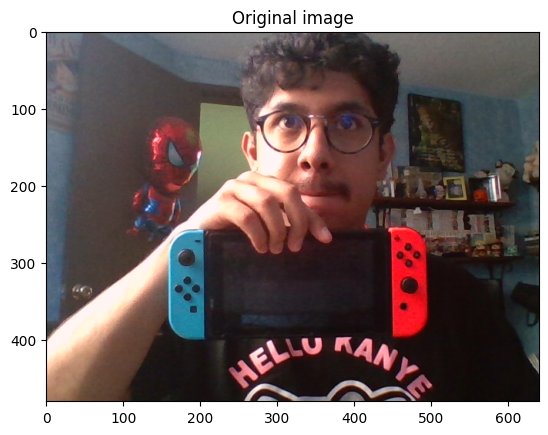

In [18]:
img = cv2.imread(img_name)
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

In [20]:
h = 0.095 # 9.5 cm = 0.095 m
h_prime = 140 # 40 px, from approx 260 to 400 in the scale

d_2 = (h*f)/h_prime
d_2

0.3301158301158301

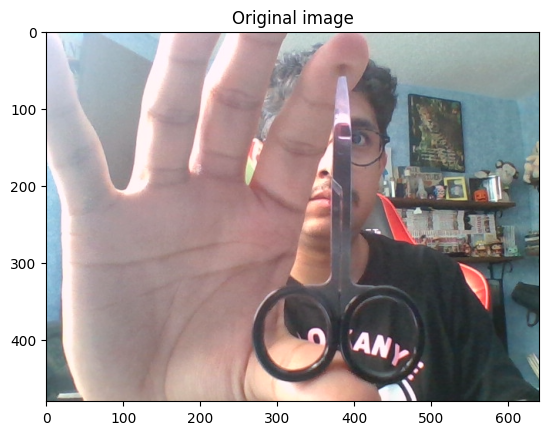

In [22]:
img = cv2.imread(img_name)
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

In [23]:
h = 0.09 # 9 cm = 0.09 m
h_prime = 440 # 440 px, from approx 40 to 480 in the scale

d_3 = (h*f)/h_prime
d_3

0.0995085995085995

In [24]:
'''
Calculating the error for each calculated distance
'''

# Original distances 30, 40 and 10 cm respectively
original_d_1 = 0.3 
original_d_2 = 0.4
original_d_3 = 0.1

e_1 = np.abs(original_d_1 - d_1)
e_2 = np.abs(original_d_2 - d_2)
e_3 = np.abs(original_d_3 - d_3)

errors = [e_1, e_2, e_3]
errors

[0.05675675675675673, 0.0698841698841699, 0.0004914004914005066]

In [25]:
# MAE

mae = np.mean(errors)
mae

0.04237744237744238

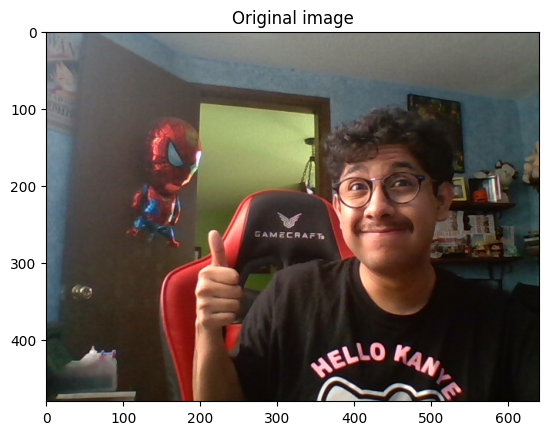

In [2]:
img = cv2.imread('capture_1723752477.6892214.png')
# Change image from BGR to RGB for plt display
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title('Original image')
plt.show()

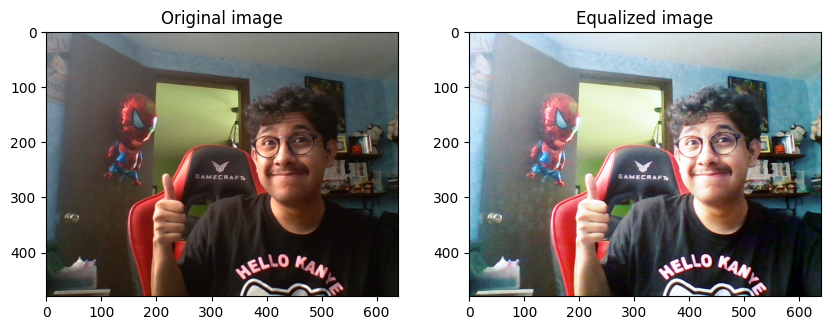

In [29]:
# Split the image into its respective R, G, B channels
r, g, b = cv2.split(img)

# Apply histogram equalization to each channel
r_eq = cv2.equalizeHist(r)
g_eq = cv2.equalizeHist(g)
b_eq = cv2.equalizeHist(b)

# Merge the equalized channels back into an RGB image
img_eq = cv2.merge([r_eq, g_eq, b_eq])

# Display the original and equalized images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_eq)
plt.title('Equalized image')

plt.show()

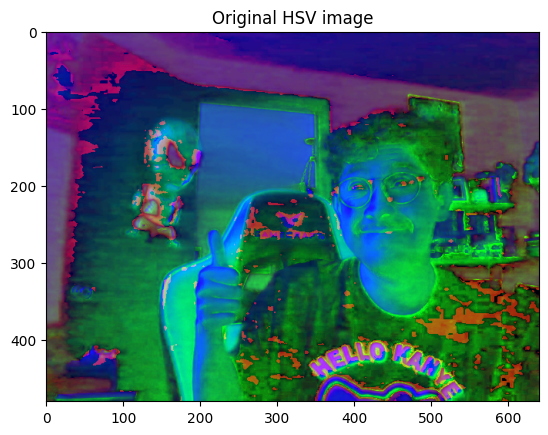

In [31]:
plt.imshow(hsv_img, cmap='gray')
plt.title('Original HSV image')

plt.show()

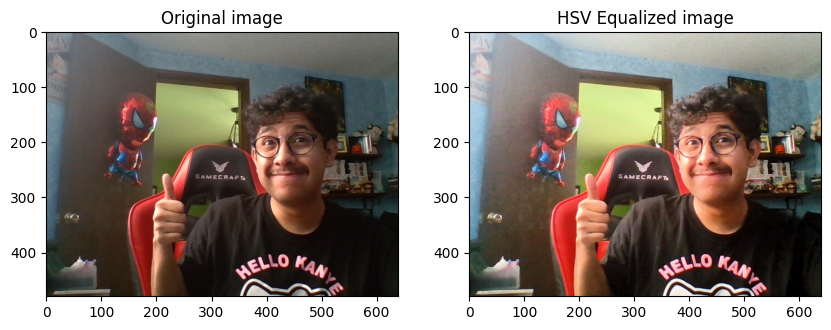

In [33]:
# Split the image into its respective H, S, V channels
h, s, v = cv2.split(hsv_img)

# Apply histogram equalization to V channel
v_eq = cv2.equalizeHist(v)

# Merge the equalized channels back into an RGB image
img_eq = cv2.merge([h, s, v_eq])
img_eq = cv2.cvtColor(img_eq, cv2.COLOR_HSV2RGB)

# Display the original and equalized images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_eq)
plt.title('HSV Equalized image')

plt.show()

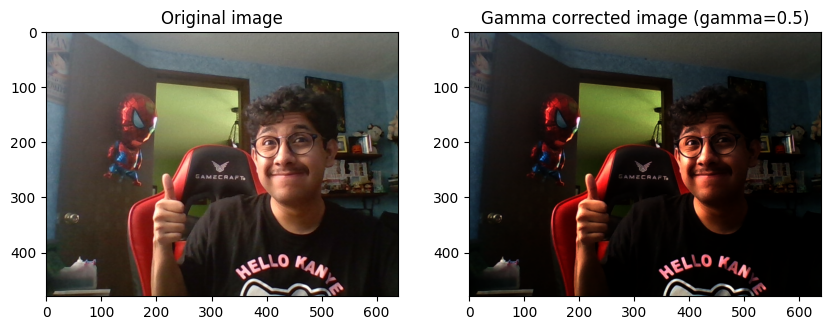

In [35]:
# Define the gamma value for enhancement (e.g., 0.5 for darker, 2.0 for brighter)
gamma = 0.5

# Build a lookup table mapping the pixel values [0, 255] to their gamma-corrected values
inv_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

# Apply gamma correction using the lookup table
img_gamma_corrected = cv2.LUT(img, table)

# Display the original and gamma-corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_gamma_corrected)
plt.title(f'Gamma corrected image (gamma={gamma})')

plt.show()

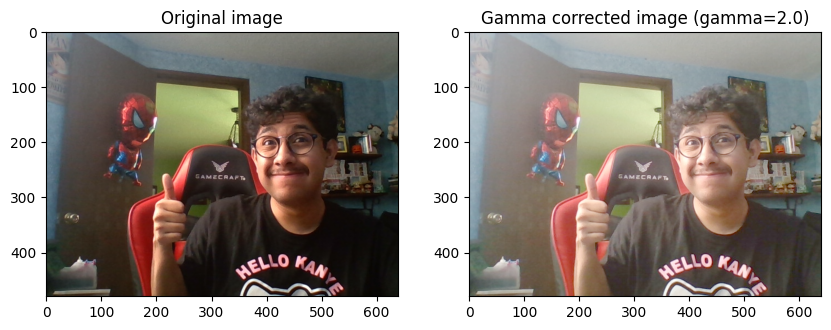

In [36]:
# Define the gamma value for enhancement (e.g., 0.5 for darker, 2.0 for brighter)
gamma = 2.0

# Build a lookup table mapping the pixel values [0, 255] to their gamma-corrected values
inv_gamma = 1.0 / gamma
table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

# Apply gamma correction using the lookup table
img_gamma_corrected = cv2.LUT(img, table)

# Display the original and gamma-corrected images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(img_gamma_corrected)
plt.title(f'Gamma corrected image (gamma={gamma})')

plt.show()

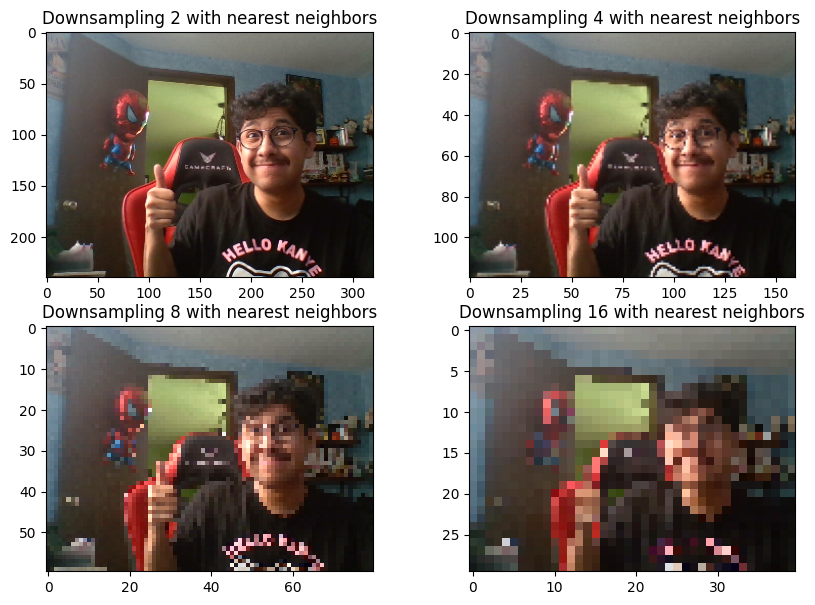

In [15]:
# Downsampling with nearest neighbors
scales = [0.5, 0.25, 0.125, 0.0625] # 2, 4, 8, 16

nn_resized_imgs = []
for scale in scales: 
  resized_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_NEAREST)
  nn_resized_imgs.append(resized_img)

# Display the downsampled images
plt.figure(figsize=(10, 7))

plt.subplot(2, 2, 1)
plt.imshow(nn_resized_imgs[0])
plt.title('Downsampling 2 with nearest neighbors')

plt.subplot(2, 2, 2)
plt.imshow(nn_resized_imgs[1])
plt.title('Downsampling 4 with nearest neighbors')

plt.subplot(2, 2, 3)
plt.imshow(nn_resized_imgs[2])
plt.title('Downsampling 8 with nearest neighbors')

plt.subplot(2, 2, 4)
plt.imshow(nn_resized_imgs[3])
plt.title('Downsampling 16 with nearest neighbors')

plt.show()

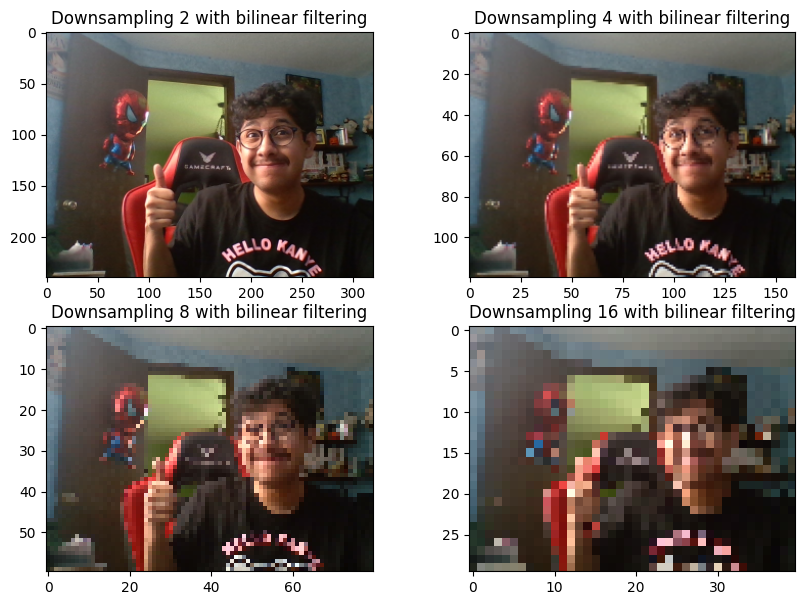

In [16]:
# Downsampling with bilinear filtering

bf_resized_imgs = []
for scale in scales: 
  resized_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
  bf_resized_imgs.append(resized_img)

# Display the downsampled images
plt.figure(figsize=(10, 7))

plt.subplot(2, 2, 1)
plt.imshow(bf_resized_imgs[0])
plt.title('Downsampling 2 with bilinear filtering')

plt.subplot(2, 2, 2)
plt.imshow(bf_resized_imgs[1])
plt.title('Downsampling 4 with bilinear filtering')

plt.subplot(2, 2, 3)
plt.imshow(bf_resized_imgs[2])
plt.title('Downsampling 8 with bilinear filtering')

plt.subplot(2, 2, 4)
plt.imshow(bf_resized_imgs[3])
plt.title('Downsampling 16 with bilinear filtering')

plt.show()

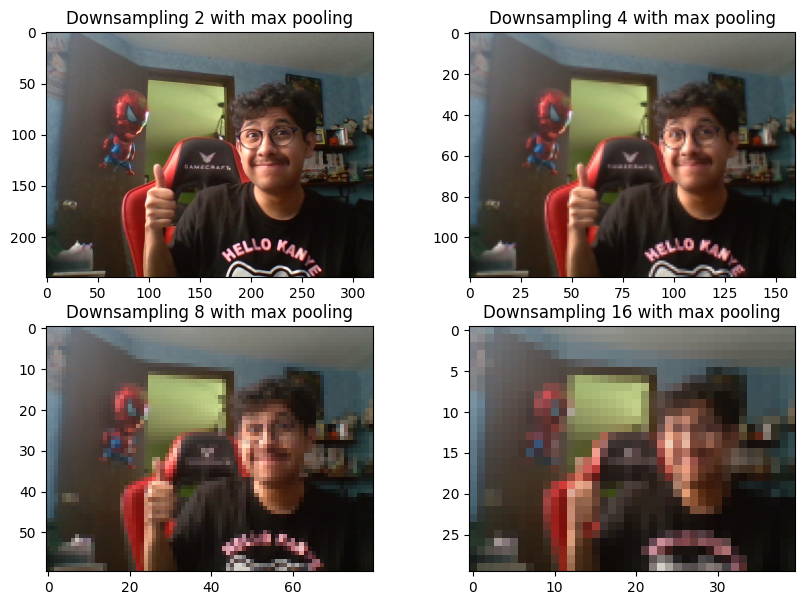

In [17]:
# Downsampling with max pooling

mp_resized_imgs = []
for scale in scales: 
  # Calculate kernel size based on the downsampling factor
  resized_img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
  mp_resized_imgs.append(resized_img)

# Display the downsampled images
plt.figure(figsize=(10, 7))

plt.subplot(2, 2, 1)
plt.imshow(mp_resized_imgs[0])
plt.title('Downsampling 2 with max pooling')

plt.subplot(2, 2, 2)
plt.imshow(mp_resized_imgs[1])
plt.title('Downsampling 4 with max pooling')

plt.subplot(2, 2, 3)
plt.imshow(mp_resized_imgs[2])
plt.title('Downsampling 8 with max pooling')

plt.subplot(2, 2, 4)
plt.imshow(mp_resized_imgs[3])
plt.title('Downsampling 16 with max pooling')

plt.show()

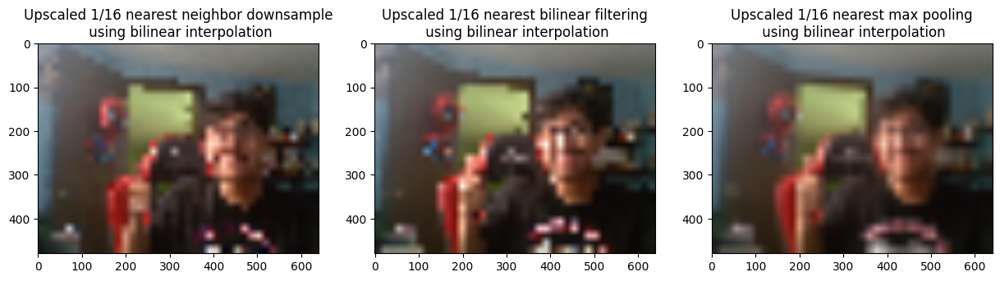

In [20]:
# Upsample 1/16 images using bilinear interpolation

nn_upscaled_img = cv2.resize(nn_resized_imgs[3], None, fx=16, fy=16, interpolation=cv2.INTER_LINEAR)
bf_upscaled_img = cv2.resize(bf_resized_imgs[3], None, fx=16, fy=16, interpolation=cv2.INTER_LINEAR)
mp_upscaled_img = cv2.resize(mp_resized_imgs[3], None, fx=16, fy=16, interpolation=cv2.INTER_LINEAR)

# Display the downsampled images
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(nn_upscaled_img)
plt.title('Upscaled 1/16 nearest neighbor downsample\n using bilinear interpolation')

plt.subplot(1, 3, 2)
plt.imshow(bf_upscaled_img)
plt.title('Upscaled 1/16 nearest bilinear filtering\n using bilinear interpolation')

plt.subplot(1, 3, 3)
plt.imshow(mp_upscaled_img)
plt.title('Upscaled 1/16 nearest max pooling\n using bilinear interpolation')

plt.show()

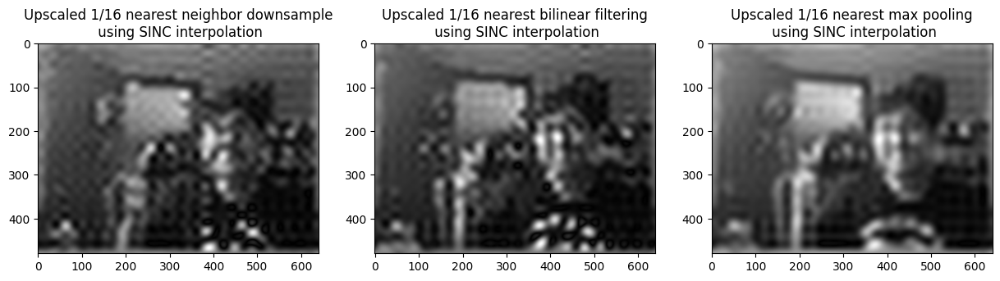

In [27]:
# Upsample 1/16 images using SINC interpolation

def sinc_interpolation_fft(image, scale_factor):
  # Convert image to grayscale if it's not already
    grayscale_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Perform FFT
    ft_img = np.fft.fft2(grayscale_img)
    ft_img_shifted = np.fft.fftshift(ft_img)

    # Get original size
    orig_size = grayscale_img.shape

    # Zero-pad the FFT image to the desired upscaled size
    padded_ft_img = np.zeros((orig_size[0] * scale_factor, orig_size[1] * scale_factor), dtype=complex)
    center_orig = np.array(orig_size) // 2
    center_pad = np.array(padded_ft_img.shape) // 2

    # Place the original FFT result in the center of the padded array
    padded_ft_img[center_pad[0] - center_orig[0]: center_pad[0] + center_orig[0],
                  center_pad[1] - center_orig[1]: center_pad[1] + center_orig[1]] = ft_img_shifted

    # Shift back before inverse FFT
    padded_ft_img_shifted_back = np.fft.ifftshift(padded_ft_img)

    # Perform inverse FFT
    upscaled_img = np.fft.ifft2(padded_ft_img_shifted_back)

    # Take magnitude and normalize
    upscaled_img_magnitude = np.abs(upscaled_img)
    upscaled_img_magnitude = np.clip(upscaled_img_magnitude, 0, 255)
    upscaled_img_magnitude = (upscaled_img_magnitude / upscaled_img_magnitude.max()) * 255
    upscaled_img_magnitude = upscaled_img_magnitude.astype(np.uint8)

    # Convert back to RGB
    upscaled_rgb_img = cv2.cvtColor(upscaled_img_magnitude, cv2.COLOR_GRAY2RGB)
    
    return upscaled_rgb_img


nn_upscaled_rgb_img = sinc_interpolation_fft(nn_resized_imgs[3], 16)
bf_upscaled_rgb_img = sinc_interpolation_fft(bf_resized_imgs[3], 16)
mp_upscaled_rgb_img = sinc_interpolation_fft(mp_resized_imgs[3], 16)

# Display the downsampled images
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(nn_upscaled_rgb_img)
plt.title('Upscaled 1/16 nearest neighbor downsample\n using SINC interpolation')

plt.subplot(1, 3, 2)
plt.imshow(bf_upscaled_rgb_img)
plt.title('Upscaled 1/16 nearest bilinear filtering\n using SINC interpolation')

plt.subplot(1, 3, 3)
plt.imshow(mp_upscaled_rgb_img)
plt.title('Upscaled 1/16 nearest max pooling\n using SINC interpolation')

plt.show()

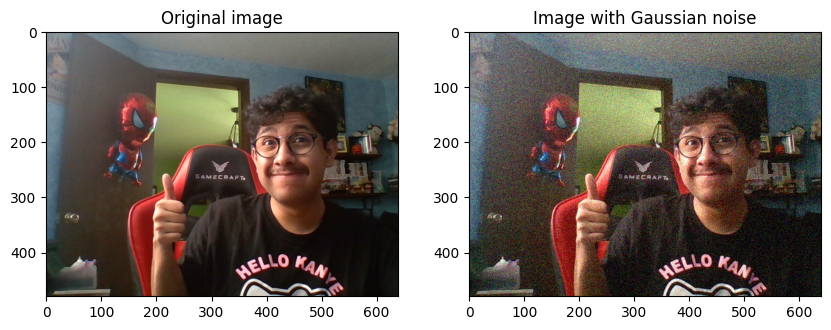

In [3]:
# Function to add Gaussian Noise
def add_gaussian_noise(image, mean=0, var=0.01):
    sigma = var**0.5
    gauss = np.random.normal(mean, sigma, image.shape)
    noisy_image = np.clip(image + gauss * 255, 0, 255).astype(np.uint8)
    return noisy_image

# Add Gaussian noise
noisy_image = add_gaussian_noise(img)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(noisy_image)
plt.title(f'Image with Gaussian noise')

plt.show()


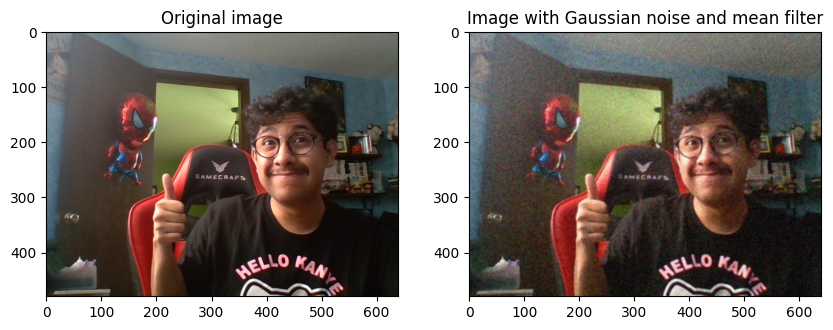

In [4]:
mean_filtered = cv2.blur(noisy_image, (3, 3))

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(mean_filtered)
plt.title(f'Image with Gaussian noise and mean filter')

plt.show()


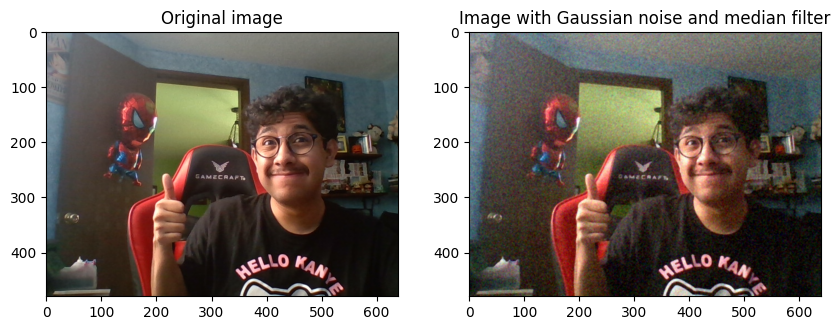

In [5]:
median_filtered = cv2.medianBlur(noisy_image, 3)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(median_filtered)
plt.title(f'Image with Gaussian noise and median filter')

plt.show()

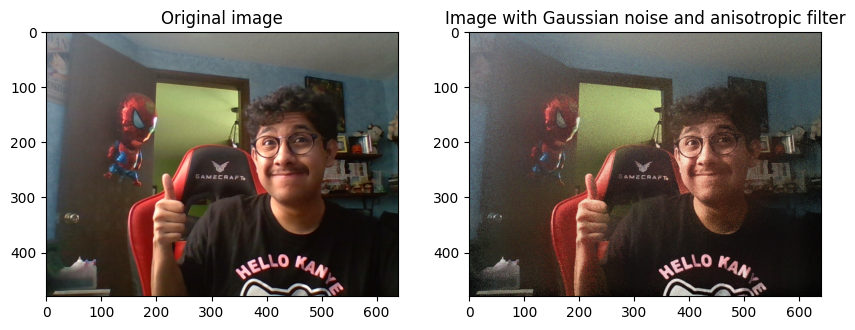

In [12]:
anisotropic_filtered = denoise_bilateral(noisy_image, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(anisotropic_filtered)
plt.title(f'Image with Gaussian noise and anisotropic filter')

plt.show()

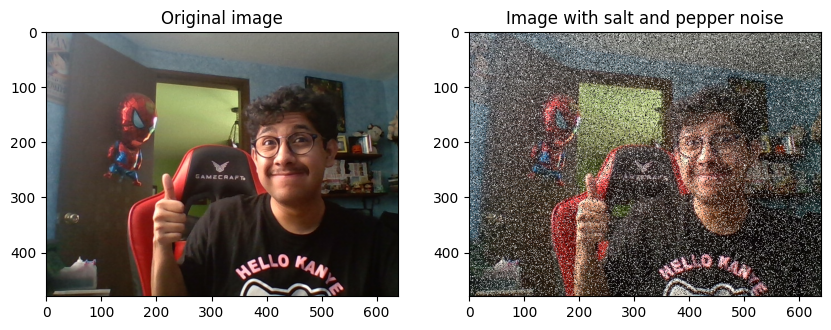

In [14]:
# Function to add salt and pepper image
def add_salt_and_pepper_noise(image, salt_prob=0.05, pepper_prob=0.05):
  noisy_image = np.copy(image)
  salt = np.ceil(salt_prob * image.size)
  pepper = np.ceil(pepper_prob * image.size)

  # Salt
  coords = [np.random.randint(0, i - 1, int(salt)) for i in image.shape]
  noisy_image[coords[0], coords[1]] = 255

  # Pepper
  coords = [np.random.randint(0, i - 1, int(pepper)) for i in image.shape]
  noisy_image[coords[0], coords[1]] = 0

  return noisy_image

sp_noisy_image = add_salt_and_pepper_noise(img)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(sp_noisy_image)
plt.title(f'Image with salt and pepper noise')

plt.show()

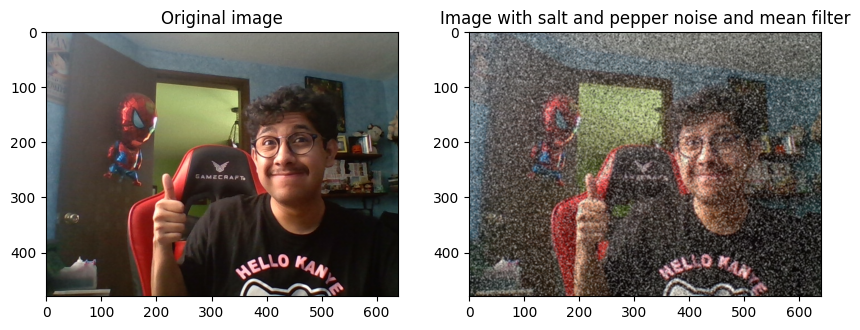

In [15]:
mean_filtered = cv2.blur(sp_noisy_image, (3, 3))

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(mean_filtered)
plt.title(f'Image with salt and pepper noise and mean filter')

plt.show()

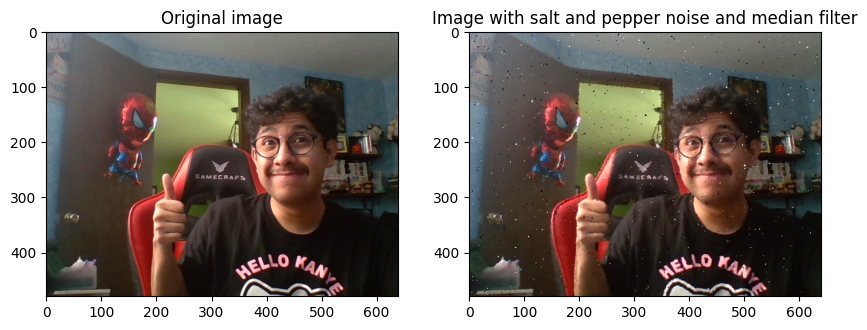

In [16]:
median_filtered = cv2.medianBlur(sp_noisy_image, 3)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(median_filtered)
plt.title(f'Image with salt and pepper noise and median filter')

plt.show()

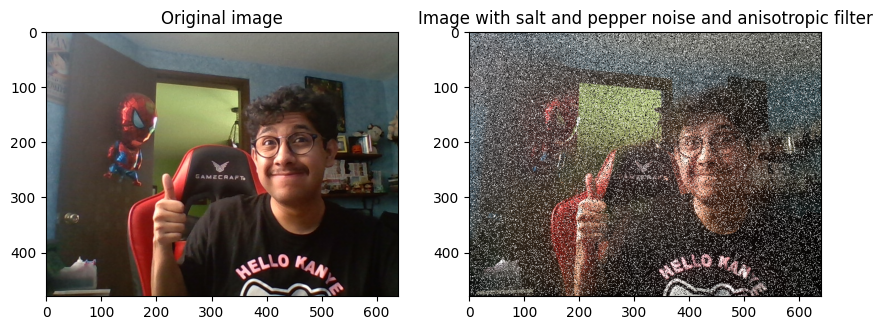

In [17]:
anisotropic_filtered = denoise_bilateral(sp_noisy_image, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)

# Display the original and noisy images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 2, 2)
plt.imshow(anisotropic_filtered)
plt.title(f'Image with salt and pepper noise and anisotropic filter')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


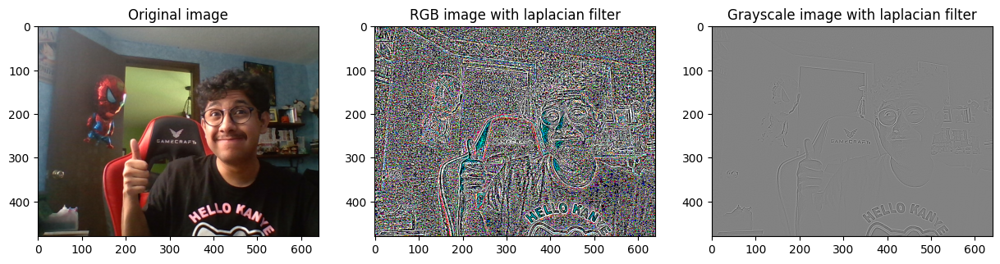

In [26]:
grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray_laplacian_img = cv2.Laplacian(grayscale_img, cv2.CV_64F)
rgb_laplacian_img = cv2.Laplacian(img, cv2.CV_64F)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_laplacian_img)
plt.title('RGB image with laplacian filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_laplacian_img, cmap='gray')
plt.title(f'Grayscale image with laplacian filter')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


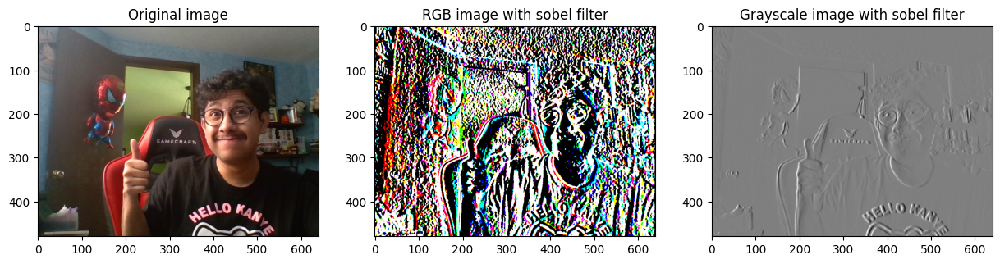

In [27]:
gray_sobel_img = cv2.Sobel(grayscale_img, cv2.CV_64F, 1, 0, ksize=5)
rgb_sobel_img = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_sobel_img)
plt.title('RGB image with sobel filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_sobel_img, cmap='gray')
plt.title(f'Grayscale image with sobel filter')

plt.show()

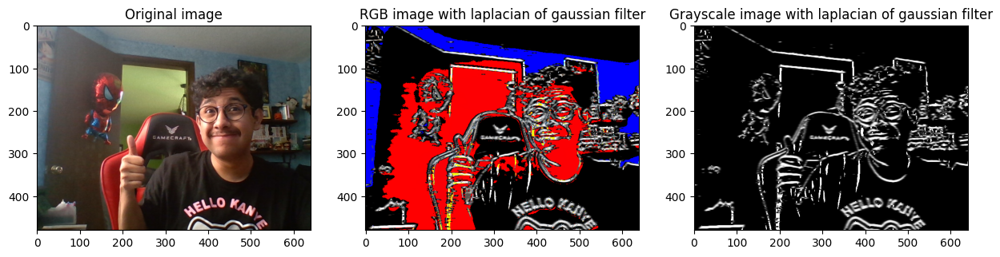

In [29]:
gray_log_img = gaussian_laplace(grayscale_img, sigma=2)
rgb_log_img = gaussian_laplace(img, sigma=2)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_log_img)
plt.title('RGB image with laplacian of gaussian filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_log_img, cmap='gray')
plt.title(f'Grayscale image with laplacian of gaussian filter')

plt.show()

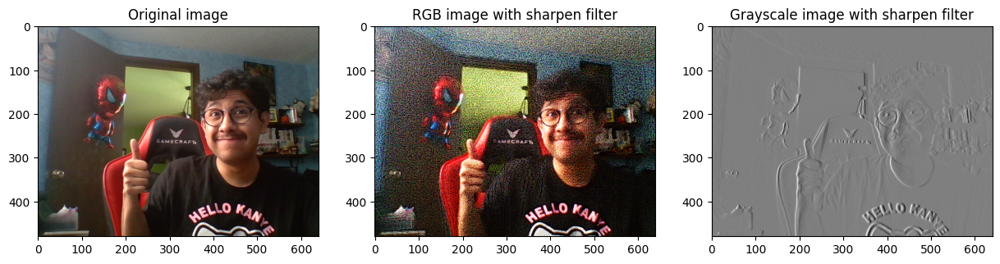

In [30]:
gray_sharpened_img = cv2.addWeighted(grayscale_img, 1.5, gray_laplacian_img.astype(np.uint8), -0.5, 0)
rgb_sharpened_img = cv2.addWeighted(img, 1.5, rgb_laplacian_img.astype(np.uint8), -0.5, 0)

# Display the original and laplacian
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1, 3, 2)
plt.imshow(rgb_sharpened_img)
plt.title('RGB image with sharpen filter')

plt.subplot(1, 3, 3)
plt.imshow(gray_sobel_img, cmap='gray')
plt.title(f'Grayscale image with sharpen filter')

plt.show()